In [1]:
using Plots
using LaTeXStrings
using LinearAlgebra
using FFTW
using BenchmarkTools
using Distributions
# using Unwrap
using JuMP
using Ipopt
# using Unwrap
Threads.nthreads()

8

In [2]:
function fftnshift(A::AbstractArray)
    B = copy(A)
    return fftshift(fft(fftshift(B)))
end
function ifftnshift(A::AbstractArray)
    B = copy(A)
    return fftshift(ifft(ifftshift(B)))
end

ifftnshift (generic function with 1 method)

In [3]:
function Pixelate_Reciprocal(image, camera_scale, physical_scale)
    # This function pixelates the image in the reciprocal space
    # It is assumed that the image is already in the reciprocal space and normally ordered
    # the averaging kernel is Fourier transform where the scaling ratio its size

    Ny, Nx = size(image)
    N = Nx
    scaling_ratio = round(Int, camera_scale/physical_scale)

    Nx_camera = Nx ÷ scaling_ratio
    Ny_camera = Ny ÷ scaling_ratio
    N_camera = Nx_camera
    

    upper = (N-1)/2 
    lower = (-N+1)/2
    kx = @. (lower:1.0:upper) * 1/(physical_scale*N )
    ky = @. (lower:1.0:upper) * 1/(physical_scale*N )

    prod = @. sinc(kx * scaling_ratio)
    FT_kernel = prod * prod'
    image_lowpass = @. FT_kernel .* image
    
    
    slct_low = (N-N_camera)÷2 + 1
    slct_high = slct_low + N_camera - 1
    kx_pixelated = kx[slct_low:slct_high]
    ky_pixelated = ky[slct_low:slct_high]
    
    image_pixelated = image_lowpass[slct_low:slct_high, slct_low:slct_high]
    image_pixelated = @. image_pixelated/ scaling_ratio^2
    return image_pixelated, kx_pixelated, ky_pixelated
end

Pixelate_Reciprocal (generic function with 1 method)

In [4]:


function Noisy_Image(A::AbstractMatrix{<:Number}, N_electrons::T ,
            background_noise::U, kspace=false) where {T<:Real,U<:Real}


    image = copy(A)
    if kspace
        # image is assumed to be in reciprocal space and normally ordered
        image = ifftnshift(image)
    end
    image = abs.(image) # image is assumed to be in real-space and real

    
    image_normalized = N_electrons .* image./sum(image)
    background_noise = rand(Poisson(background_noise), size(image))
    image_poisson =  rand.(Poisson.(image_normalized))
    image_noisy = image_poisson .+ background_noise

    if kspace
        image_noisy = fftnshift(image_noisy)
        return image_noisy
    end

    return image_noisy
end



Noisy_Image (generic function with 2 methods)

In [5]:
function Find_Crossing(func, y_point, x)
    N = length(func)
    f = func .- y_point
    x_intercepts = []

    for i in 1:N-1
        if f[i]*f[i+1] < 0
            # Linear interpolation to find the crossing point
            dfdx = (f[i+1] - f[i]) / (x[i+1] - x[i])
            x_intercept = x[i] - f[i]/dfdx
            x_intercepts = push!(x_intercepts, x_intercept)
        end
        
    end
    return x_intercepts
end
function Find_Spacing(x_intercepts)
    if length(x_intercepts) == 0
        return Inf
    end


    if mod(length(x_intercepts),2) == 1
        x_intercepts = x_intercepts[1:end-1]
    end
    centers = @. (x_intercepts[1:2:end] + x_intercepts[2:2:end])/2
    
    spacing = centers[2:end] .- centers[1:end-1]
    spacing = sort!(spacing)
    return spacing[length(spacing)÷2]
end

Find_Spacing (generic function with 1 method)

In [6]:
function Diff_Image(image, c=0.01)
    return @. log1p(c*abs(image))
end
function Autocorrelation(image)
    # the image is assumed to be in real space
    
    image_fft = fftnshift(image)
    image_auto = ifftnshift(image_fft .* conj.(image_fft))
    if eltype(image) <: Real 
        return real.(image_auto)
    end
    return image_auto
end
function Autocorrelation_Normalized(image)
    # the image is assumed to be in real space
    Ny, Nx = size(image)
    image_auto = Autocorrelation(image)
    image_auto = image_auto./(Ny*Nx)
    image_auto = image_auto .- sum(image_auto)/(Ny*Nx)
    image_auto = image_auto ./ maximum(abs.(image_auto))
    return image_auto
end

Autocorrelation_Normalized (generic function with 1 method)

In [7]:
function Wavelength(E)
    hc = 12.398 #keV*Angstrom
    # h = 6.582119e-16 #eV*sec
    # mc2 = 511 #keV
    E₀ = 511 #keV
    return hc/sqrt(E*(2*E₀ + E))
end

function Focus(E, Cs, nᵢ=1)
    return sqrt((2*nᵢ-0.5)*Cs*Wavelength(E))
end
kmax(E, Cs) = (6/((Cs*Wavelength(E)^3)))^(1/4)

function TEM_Image(wf_transmission, E, Cs)
    Ny, Nx = size(wf_transmission)
    if Nx != Ny
        error("Image must be square")
    elseif 2^(floor(Int, log2(Nx))) != Nx
        error("Image must be power of 2")
    end
    N = Nx

    upper = (N-1)/2 + 0.1
    lower = (-N+1)/2
    kx = lower:1.0:upper
    ky = lower:1.0:upper

    k = @. sqrt(kx'^2 + ky^2)
    disk = k.<=N/2

    λ = Wavelength(E)
    Δf = Focus(E, Cs)
    Hₒ = @. exp(-1im*(π*λ*k^2*(0.5*Cs*λ^2*k^2 - Δf)))*disk
    
    fft_ideal_image = fftnshift(wf_transmission)
    fft_physical_image = fft_ideal_image.*Hₒ
    image_physical = ifftnshift(fft_physical_image)
    
    return image_physical
end

TEM_Image (generic function with 1 method)

In [8]:
E = 300
Cs = 1 #mm
Cs = Cs * 1e7 #convert to Angstroms

N = 2^8
physical_scale = 1
camera_scale = 2

upper = (N-1)/2 + 0.1
lower = (-N+1)/2
kx = lower:1:upper
ky = lower:1:upper

k = @. sqrt(kx'^2 + ky^2)
disk = k.<=N/2

kx = kx./maximum(kx).*kmax(E, Cs)
ky = ky./maximum(ky).*kmax(E, Cs)
k = @. sqrt(kx'^2 + ky^2)

Δk = kx[2] - kx[1]
L = 1/Δk
ΔL = L/N

x = LinRange(-L/2, L/2, N)
y = LinRange(-L/2, L/2, N)

λ(E) = Wavelength(E)
Δf(E, Cs) = Focus(E, Cs)

H = @. exp(-1im*(π*λ(E)*k^2*(0.5*Cs*λ(E)^2*k^2 - Δf(E, Cs)))*disk)*disk
f(x, y, xc, yc, σ₁, σ₂) = @. (1/((2*pi)*sqrt(σ₁*σ₂)))*exp(-(x - xc)^2/(2σ₁^2) -(y - yc)^2/(2σ₂^2) )
heatmap(kx, ky, angle.(H), title="angle of the tansfer function H",  
        xlabel=L"k_x\, Å^{-1}", ylabel=L"k_y\, Å^{-1}", aspect_ratio=1)
xlims!(kx[1], kx[end])
ylims!(ky[1], ky[end]);

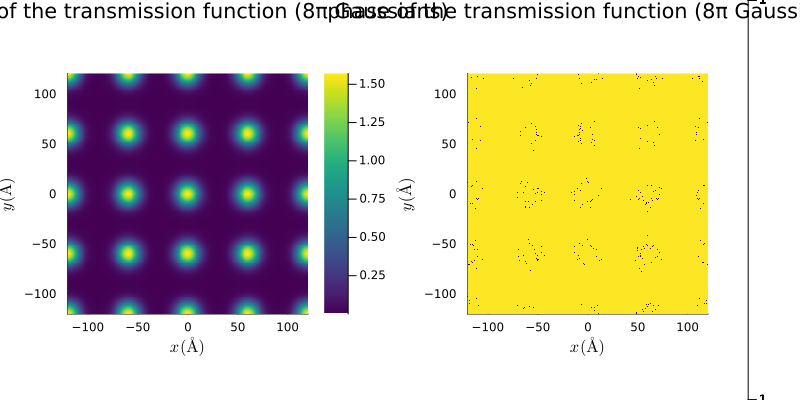

GKS: Possible loss of precision in routine SET_WINDOW
GKS: Rectangle definition is invalid in routine CELLARRAY
GKS: Rectangle definition is invalid in routine CELLARRAY
GKS: Rectangle definition is invalid in routine CELLARRAY


In [9]:
S = 5
σ₊, σ₋ = 8, 8
phase_real = zeros(N, N)
phase_complex = zeros(N, N)
indices = round.(Int, LinRange(1, N, S))
# for i in indices, j in indices
#     phase[j, i] += 1
# end
for i in indices, j in indices
    xc = x[i]
    yc = y[j]
    phase_real += f(x',y, xc, yc, σ₊, σ₋)
    phase_complex += f(x',y, xc, yc, σ₊, σ₋) 
end


phase_real = phase_real./maximum(phase_real) *π/2
phase_complex = phase_complex./maximum(phase_complex) * 0.0
phase = phase_real 

Ψₜ = @. exp(1im*phase)
fig1 = heatmap(x,y,abs.(phase), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
xlabel!(L"x\, (Å)")
ylabel!(L"y\, (Å)")
xlims!(-L/2, L/2)
ylims!(-L/2, L/2)
title!("angle of tramission function (8π Gaussians)")
# vline!([spacing_x], color=:black, lw=2)
# hline!([spacing_y], color=:black, lw=2)

fig2 = heatmap(x,y,abs.(Ψₜ), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
xlabel!(L"x\, (Å)")
ylabel!(L"y\, (Å)")
xlims!(-L/2, L/2)
ylims!(-L/2, L/2)

plot(fig1, fig2, layout=(1,2), size=(800, 400), title="phase of the transmission function (8π Gaussians)", legend=false)

spacing: Inf


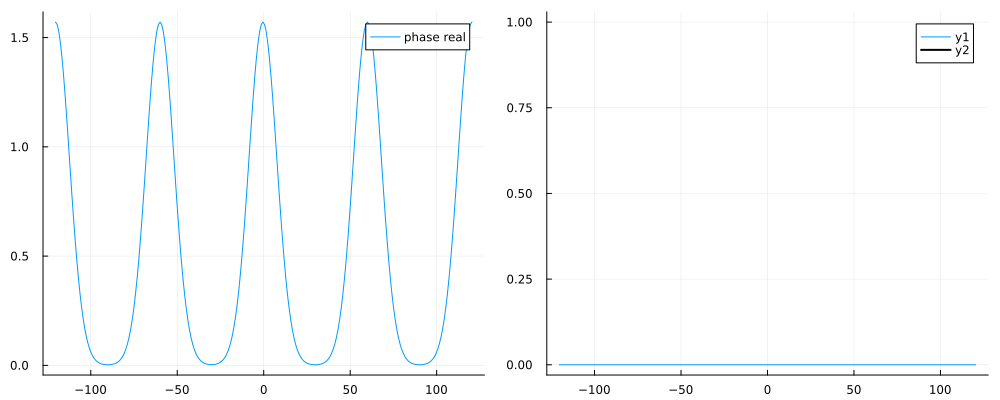

In [10]:
x_intercepts = Find_Crossing(phase_real[:, 1], 3, x)
spacing = Find_Spacing(x_intercepts)
println("spacing: ", spacing)
fig = plot(x,phase_real[:, 1], label="phase real")
fig2 = plot(x,phase_complex[:,1])
vline!([spacing], color=:black, lw=2)
plot(fig,fig2, layout=(1,2), size=(1000,400))


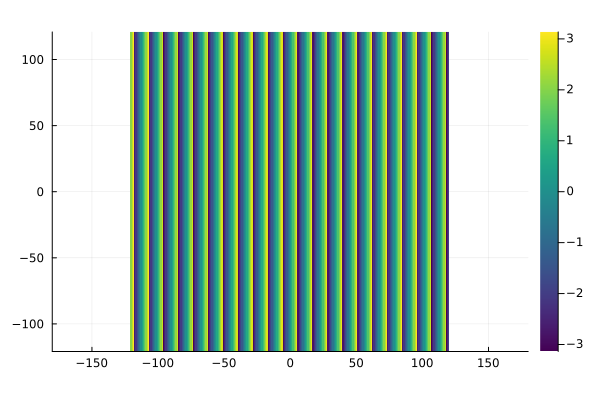

In [11]:
# Define the incident angle (θ) in radians and wave vector magnitude (k0)
θ = deg2rad(.1)      # incident angle (radians)
ϕ = deg2rad(0) # azimuthal angle (radians)

# Wavevector components; here we tilt the plane wave along x-direction
kmag = 2 * pi / Wavelength(300)


# Create the plane wave by computing the phase exp(i*(kx*x + ky*y))
ref_wave = @. exp(1im * kmag * (sin(θ)*cos(ϕ)*x' + sin(θ)*sin(ϕ)*y))

# Plot the amplitude
# heatmap(abs.(ref_wave), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
heatmap(x,y,angle.(ref_wave), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)

\begin{align}
    \psi_{ref}(x) &= A e^{i\vec{k} \cdot \vec{r}}\\
    &= A e^{i|k| \hat{k} \cdot \vec{r} }\\
    &= A e^{i|k|(\sin(\theta)\hat{y},cos(\theta)\hat{z}) \cdot (x,y) }
\end{align}

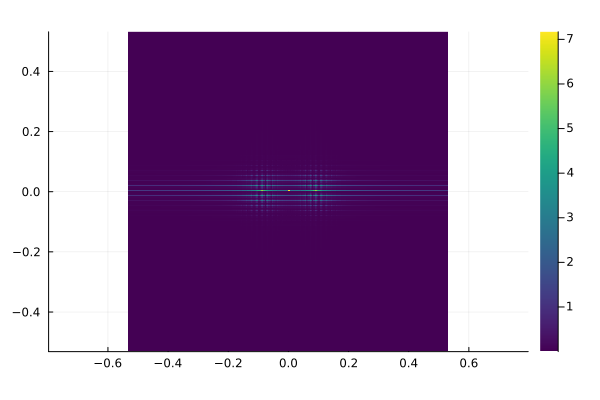

In [12]:
Ψₜ = @. exp(1im*phase)

ideal_measured = abs2.(Ψₜ .+ ref_wave)
# ideal_measured = ideal_measured./sum(ideal_measured)
# println("sum(ideal_measured): ", sum(ideal_measured))
ideal_fft = fftnshift(ideal_measured)
heatmap(kx,ky,Diff_Image(ideal_fft,0.01), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)

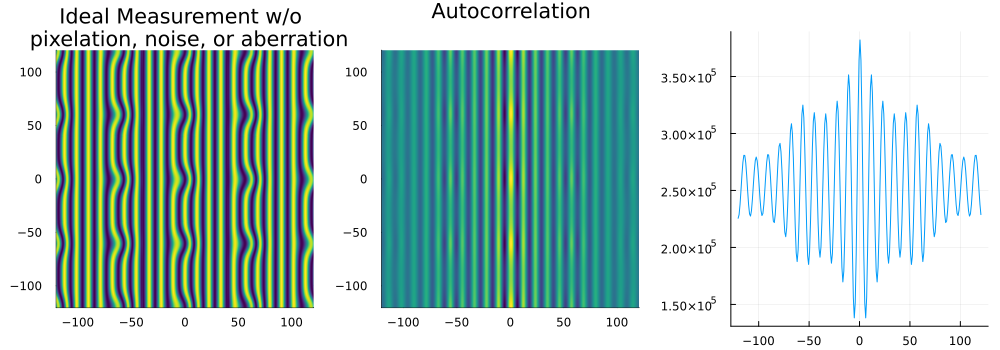

In [13]:
ideal_autocorr = Autocorrelation(ideal_measured)
fig1 = heatmap(x,y, ideal_measured, aspect_ratio=1, c=:viridis, 
    colorbar=false, axis=true)
    xlims!(-L/2, L/2)
    ylims!(-L/2, L/2)
    title!("Ideal Measurement w/o \n pixelation, noise, or aberration") 
fig2 = heatmap(x,y, ideal_autocorr, aspect_ratio=1, c=:viridis, 
colorbar=false, axis=true, title="Autocorrelation")
xlims!(-L/2, L/2)
ylims!(-L/2, L/2)
fig3 = plot(x,ideal_autocorr[1,:], label=false)
# title!("Ideal Measurement w/o \n pixelation, noise, or aberration\n") 
plot(fig1, fig2, fig3, layout=(1,3), size=(1000,350))

In [17]:
using ImageFiltering
using Unwrap

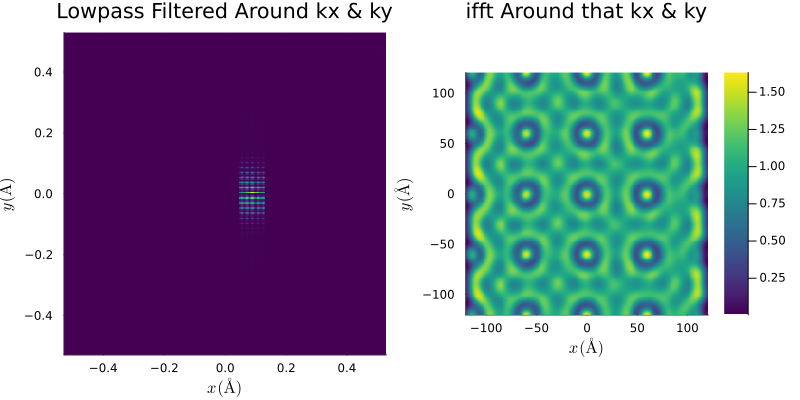

In [29]:
shifts = 1/Δx 
shifts_y = 1/Δy 
kx_disk = kx .- shifts
ky_disk = ky .- shifts_y

r_disk = @. sqrt(kx_disk'^2 + ky_disk^2)
# fft_smalldisk = r_disk.<=N/2*Δk
fft_disk = r_disk.<= shifts/2
mask = kx'.*ky./ky .>= shifts/2
mask = mask .& (kx'.*ky./ky .<= 3*shifts/2)
mask2 = kx'.*ky./ky .<= -shifts/2

 
ideal_unwrapped_lowpass = fftnshift(ideal_measured).*mask
ideal_test2 = fftnshift(ideal_measured).*mask2
ideal_unwrapped_lowpass_real = ifftnshift(fftnshift(ideal_measured).*fft_disk)
test = copy(ideal_unwrapped_lowpass_real)
fig1 = heatmap(kx,ky, Diff_Image(ideal_unwrapped_lowpass,0.01), aspect_ratio=1, c=:viridis, colorbar=false, axis=true)
xlims!(kx[1], kx[end])
ylims!(ky[1], ky[end])
title!("Lowpass Filtered Around kx & ky")

fig2 = heatmap(x,y,abs2.(test), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
xlims!(x[1], x[end])
ylims!(y[1], y[end])
title!("ifft Around that kx & ky")
plot(fig1, fig2, layout=(1,2), size=(800, 400), 
    xlabel=L"x\, (Å)", ylabel=L"y\, (Å)")

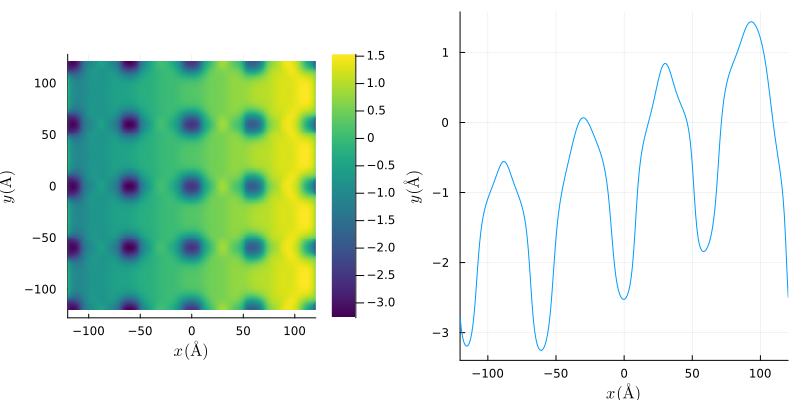

In [32]:
shifts = round(Int,1/Δx /Δk  )
shifts_y = round(Int,1/Δy/Δk )
test_shifted = circshift(fftnshift(ideal_measured).*mask, (shifts_y, -shifts))
test_reconstructed = ifftnshift(test_shifted)/(π*shifts^2/(4*N^2))
phase_reconstruced = atan.(imag.(test_reconstructed), real.(test_reconstructed))
phase_unwrapped = unwrap(phase_reconstruced, (true,true))
# gradient = .+2.1 .-x.*1.5 ./maximum(x)
# phase_unwrapped = phase_unwrapped .+ reshape(gradient,(1,N))
fig1 = heatmap(x,y,phase_unwrapped, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
xlims!(-L/2, L/2)
fig2 = plot(x,phase_unwrapped[N÷2+1,:], label=false)
xlims!(-L/2, L/2)
plot(fig1, fig2, layout=(1,2), size=(800, 400), 
    xlabel=L"x\, (Å)", ylabel=L"y\, (Å)")

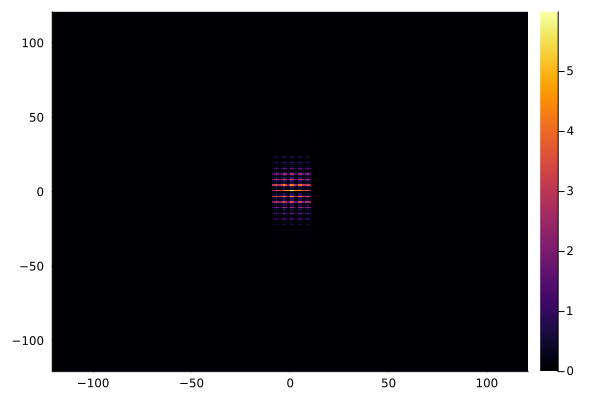

In [31]:
heatmap(x,y,Diff_Image(test_shifted))

In [33]:
# spacing_x = (-N/2:64:N/2).*Δx
# spacing_y = (-N/2:64:N/2).*Δy
shift = 50
fig = plot(x,reconstructed_autocorr[shift,:], label="autocorr")
plot!(y, reconstructed_autocorr[:,shift], label="autocorr", linestyle=:dash)

x_intercepts = Find_Crossing(reconstructed_autocorr[shift,:], maximum(reconstructed_autocorr[shift,:])/2, x)
y_intercepts = Find_Crossing(reconstructed_autocorr[:,shift], maximum(reconstructed_autocorr[:,shift])/2, y)
x_spacing = Find_Spacing(x_intercepts)
y_spacing = Find_Spacing(y_intercepts)
println("spacing: ", x_spacing, " ", y_spacing)
println("spacing in pixels: ", x_spacing/ΔL, " ", y_spacing/ΔL)
println(ΔL)
vline!([x_spacing])
display(fig)
# plot!(y, test_reconstruct[:,1], label="reconstructed")

UndefVarError: UndefVarError: `reconstructed_autocorr` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

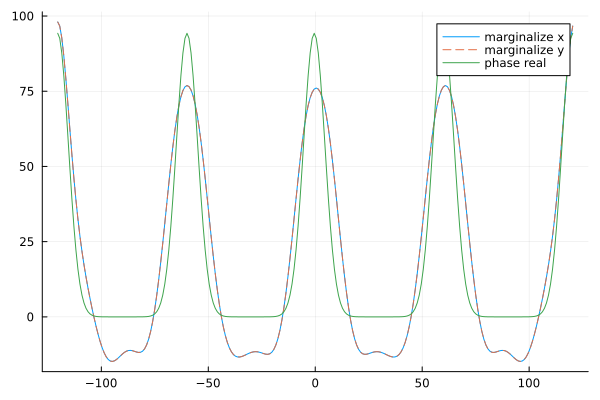

spacing: 60.39147618039582 60.39147618039598
spacing in pixels: 64.21134704194952 64.2113470419497
0.9405109682707924


In [52]:
marginalize_x = dropdims(sum(reconstructed_autocorr, dims=1), dims=1)
marginalize_y = dropdims(sum(reconstructed_autocorr, dims=2), dims=2)
fig = plot(x, marginalize_x, label="marginalize x")
plot!(y, marginalize_y, label="marginalize y", linestyle=:dash)
plot!(x,phase_real[:, 1].*10, label="phase real")
# vline!([x_spacing], color=:black, lw=2)
display(fig)

x_intercepts = Find_Crossing(marginalize_x, maximum(marginalize_x)/2, x)
y_intercepts = Find_Crossing(marginalize_y, maximum(marginalize_y)/2, y)
x_spacing = Find_Spacing(x_intercepts)
y_spacing = Find_Spacing(y_intercepts)
println("spacing: ", x_spacing, " ", y_spacing)
println("spacing in pixels: ", x_spacing/ΔL, " ", y_spacing/ΔL)
println(ΔL)

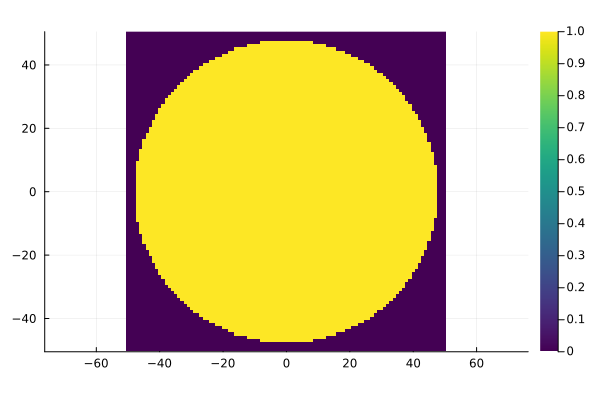

In [28]:
ms = -50:50
ns = -50:50

s = @. λ(E)*sqrt((1/Δx + ms'/ΔL)^2 + (1/Δy + ns/ΔL)^2) 
mask = s.<=1
heatmap(ms, ns, mask, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)

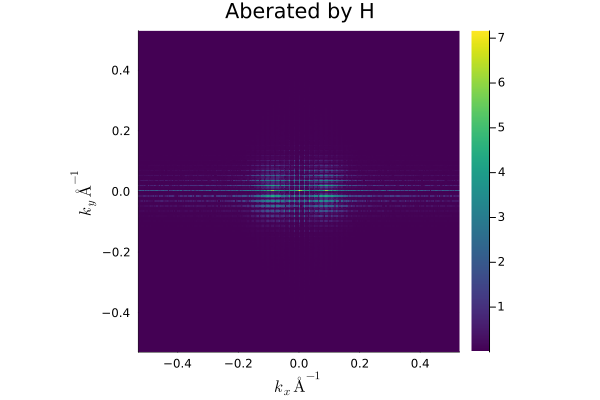

In [14]:
physical = TEM_Image(Ψₜ, E, Cs)
physical_ref = TEM_Image(ref_wave, E, Cs)
physical_measured = @. abs2( physical + physical_ref)
physical_fft = fftnshift(physical_measured)

heatmap(kx,ky,Diff_Image(physical_fft,0.01), 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"k_x\, Å^{-1}",
    ylabel=L"k_y\, Å^{-1}",
    title="Aberated by H")
xlims!(kx[1], kx[end])
ylims!(ky[1], ky[end])

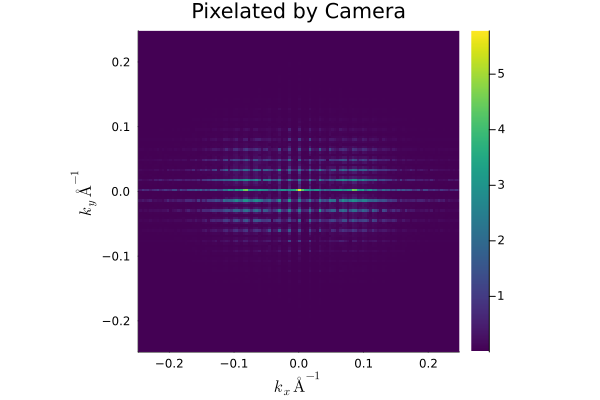

In [15]:
physical_fft_pixelated_in_kspace,kx_camera,ky_camera = Pixelate_Reciprocal(physical_fft, camera_scale, physical_scale)
physical_pixelated = abs.(ifftnshift(physical_fft_pixelated_in_kspace))


heatmap(kx_camera,ky_camera,Diff_Image(physical_fft_pixelated_in_kspace,0.01), 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"k_x\, Å^{-1}",
    ylabel=L"k_y\, Å^{-1}",
    title="Pixelated by Camera")
xlims!(kx_camera[1], kx_camera[end])
ylims!(ky_camera[1], ky_camera[end])

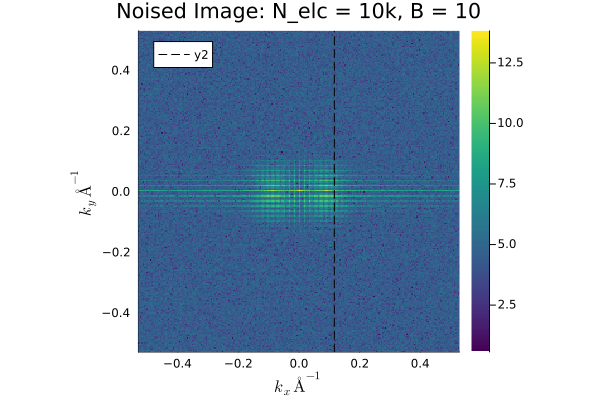

In [16]:
N_electrons = 1e8
B = 10
physical_measured_noised = Noisy_Image(physical_measured, N_electrons, B)
physical_fft_noised = fftnshift(physical_measured_noised)

heatmap(kx, ky, Diff_Image(physical_fft_noised, 0.01), 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"k_x\, Å^{-1}",
    ylabel=L"k_y\, Å^{-1}",
    title="Noised Image: N_elc = 10k, B = $B")
xlims!(kx[1], kx[end])
ylims!(ky[1], ky[end])
vline!([1/8.57], color=:black, linestyle=:dash)

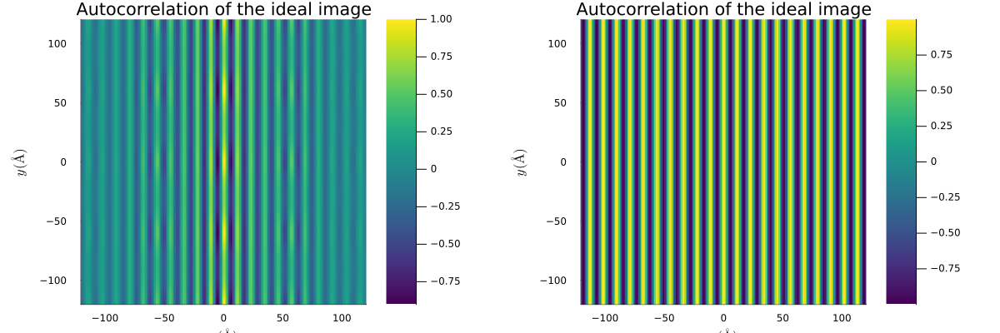

In [27]:

ideal_autocorr = Autocorrelation_Normalized(ideal_measured)
physical_autocorr = Autocorrelation_Normalized(physical_measured)
noisy_autocorr = Autocorrelation_Normalized(physical_measured_noised)
pixelated_autocorr = Autocorrelation_Normalized(physical_pixelated)


mask = ideal_autocorr .< maximum(ideal_autocorr).*0.5 
# println(maximum(imag.(ideal_autocorr))
fig1 = heatmap(x,y, ideal_autocorr, 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"x\, (Å)",
    ylabel=L"y\, (Å)",
    title="Autocorrelation of the ideal image")
    xlims!(-L/2, L/2)
    ylims!(-L/2, L/2)
fig2 = heatmap(x,y, cos.(angle.(ref_wave)), 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"x\, (Å)",
    ylabel=L"y\, (Å)",
    title="Autocorrelation of the physical image")
    xlims!(-L/2, L/2)
    ylims!(-L/2, L/2)
plot(fig1, fig2, layout=(1,2), size=(1200, 400), 
    xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", title="Autocorrelation of the ideal image")


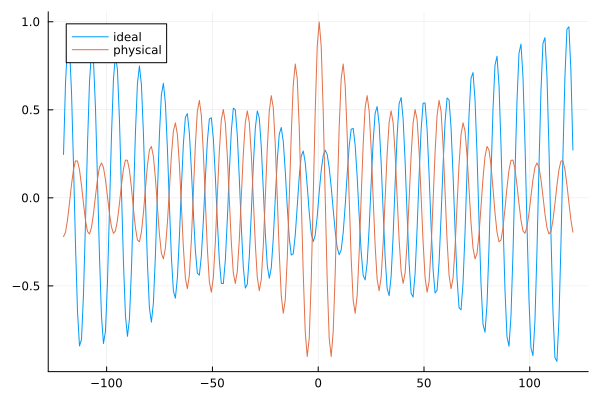

In [18]:
diff_g = ideal_autocorr .- cos.(angle.(ref_wave))
fig3 = heatmap(x,y, diff_g, 
    aspect_ratio=1, 
    c=:viridis, 
    colorbar=:true, 
    axis=true,
    xlabel=L"x\, (Å)",
    ylabel=L"y\, (Å)",
    title="Difference")
plot(x,diff_g[1,:], label="ideal")
plot!(x, ideal_autocorr[1,:], label="physical")
# plot!(x, cos.(angle.(ref_wave)), label="noisy")
# plot!(x, cos.(), label="ideal", linestyle=:dash)

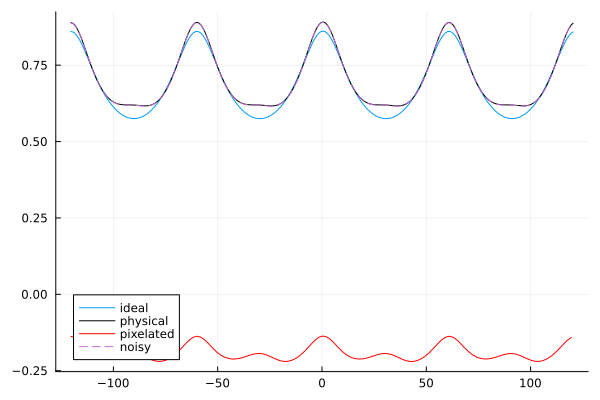

In [19]:
plot(x, ideal_autocorr[:,N÷2], label="ideal")
plot!(x, physical_autocorr[:,N÷2], label="physical", color=:black)
plot!(x[1:camera_scale÷physical_scale:end], pixelated_autocorr[:,N÷2], label="pixelated", color=:red)
plot!(x, noisy_autocorr[:,N÷2], label="noisy", linestyle=:dash)

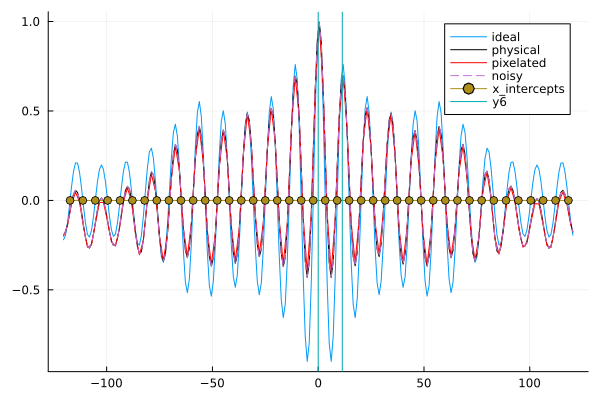

In [26]:
plot(x, ideal_autocorr[N÷4,:], label="ideal")
plot!(x, physical_autocorr[N÷4,:], label="physical", color=:black)
plot!(x[1:camera_scale÷physical_scale:end], pixelated_autocorr[N÷2,:], label="pixelated", color=:red)
plot!(x, noisy_autocorr[N÷2,:], label="noisy", linestyle=:dash)
plot!(x_intercepts, zeros(length(x_intercepts)), marker=:o, label="x_intercepts")
vline!([0.0, spacing_xaverage])
# vline!([spacing_xaverage])

In [21]:
x_intercepts = Find_Crossing(ideal_autocorr[N÷2,:], 0.0, x)
y_intercepts = Find_Crossing(ideal_autocorr[:,N÷2], 0.0, y)
x_intercepts = Find_Crossing(ideal_autocorr[1,:], 0.0, x)
y_intercepts = Find_Crossing(ideal_autocorr[:,1], 0.0, y)

spacing_xaverage = Find_Spacing(x_intercepts)
spacing_yaverage = Find_Spacing(y_intercepts)
println("spacing_xaverage: ", spacing_xaverage)
println("spacing_yaverage: ", spacing_yaverage)
println("wavelength ", Wavelength(E))

spacing_xaverage: 11.37905156460505
spacing_yaverage: Inf
wavelength 0.019686806700005176


\begin{equation}
    \tan\phi = \frac{\Delta x}{\Delta y} \qquad \sin\theta = \frac{2\pi}{\Delta y \sin\phi |k|} = \frac{2\pi \sqrt{(\Delta x)^2+ (\Delta y)^2}}{\Delta y \Delta x |k|}
\end{equation}

In [25]:
kx_real = 1/(Wavelength(E)) *sin(θ)*cos(ϕ)
ky_real = 1/(Wavelength(E)) *sin(θ)*sin(ϕ)
println("kx_real: ", kx_real, " ky_real ", ky_real)
m_real = ((1/Δx) - kx_real)*ΔL
n_real = ((1/Δy) - ky_real)*ΔL
println("m_real: ", m_real, " n_real ", n_real)
m_obs = round.(ΔL/spacing_xaverage)
n_obs = round.(ΔL/spacing_yaverage)
println("m_obs: ", m_obs, " n_obs", n_obs)

kx_real: 0.08865472153479567 ky_real 0.0
m_real: -0.0007278944816534429 n_real 0.0
m_obs: 0.0 n_obs0.0


In [24]:
fs   = 1/ΔL
fobs = 1/Δx          # = f_y_obs here

cands = []
for m = -10:10, n = -10:10
    fx = fobs + m*fs
    fy = fobs + n*fs
    s  = λ(E)*sqrt(fx^2+fy^2)
    if 0 < s ≤ 1             # physical
        push!(cands,(m,n,s,fx,fy))
    end
end
println("candidates: ", cands)

candidates: Any[(-10, -10, 0.29357693105098703, -10.544637426954257, -10.544637426954257), (-10, -9, 0.2791683953550593, -10.544637426954257, -9.481385605618687), (-10, -8, 0.26562919926591466, -10.544637426954257, -8.418133784283118), (-10, -7, 0.2530988938298879, -10.544637426954257, -7.354881962947549), (-10, -6, 0.2417344175555157, -10.544637426954257, -6.2916301416119795), (-10, -5, 0.23170737412008605, -10.544637426954257, -5.22837832027641), (-10, -4, 0.22319808652870712, -10.544637426954257, -4.1651264989408405), (-10, -3, 0.21638568449936, -10.544637426954257, -3.101874677605271), (-10, -2, 0.21143425242889685, -10.544637426954257, -2.0386228562697015), (-10, -1, 0.20847642975119754, -10.544637426954257, -0.975371034934132), (-10, 0, 0.207597448060363, -10.544637426954257, 0.08788078640143754), (-10, 1, 0.20882355982569079, -10.544637426954257, 1.151132607737007), (-10, 2, 0.2121182638367149, -10.544637426954257, 2.2143844290725765), (-10, 3, 0.21738752628810176, -10.544637426

In [23]:
Δx = spacing_xaverage
Δy = spacing_yaverage
ϕ_measured = atan(Δx, Δy)
θ_measured = asin(Wavelength(E)*sqrt(Δx^2 + Δy^2)/(Δx*Δy))
println(π/2)
println("ϕ_measured: ", rad2deg(ϕ_measured))
println("θ_measured: ", rad2deg(θ_measured))
println(round(deg2rad(1)*kmag/(1/ΔL), digits=2))

1.5707963267948966
ϕ_measured: 0.0
θ_measured: NaN
5.24


In [32]:
println(1/spacing_xaverage + 12/ΔL) 
println(1/Wavelength(E)*deg2rad(1))

12.87556190781275
0.8865476654443255


In [ ]:

# function reference_model(A, C, θ_polar,ϕ_azi)
#     return @. A*cos(2π/Wavelength(E) * sin(θ_polar)*(cos(ϕ_azi)*x' + sin(ϕ_azi)*y)) + C
# end

# model_ref = Model(Ipopt.Optimizer)
# @variable(model_ref, A_const, start=maximum(ideal_autocorr))
# @variable(model_ref, C_const)
# # @variable(model_ref, θ_polar, lower_bound=0, upper_bound=π, start=θ)
# # @variable(model_ref, ϕ_azi, lower_bound=0, upper_bound=2π, start = ϕ)
# @variable(model_ref, θ_polar, lower_bound=0, upper_bound=π/2)
# @variable(model_ref, ϕ_azi, lower_bound=0, upper_bound=2π)

# ref_term = @expression(model_ref, reference_model(A_const, θ_polar, ϕ_azi)) 


# # costb = @expression(model, smooth_penalty(b))


# @objective(model_ref, Min,
#     sum((ref_term .- ideal_autocorr).^2))


# set_optimizer_attribute(model_ref, "print_level", 5)
# optimize!(model_ref)

This is Ipopt version 3.14.17, running with linear solver MUMPS 5.7.3.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:        6

Total number of variables............................:        4
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.5960181e+04 0.00e+00 1.06e+06  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

InterruptException: InterruptException:

In [72]:
using JuMP
using Ipopt

In [184]:
println(value(θ_polar), " ", value(ϕ_azi), " ", value(A_const), " ", value(C_const))
println("should get ", θ, " ", ϕ)

1.5707963268208955 0.7853981633974484 1.0000152661383224 0.0
should get 1.5707963267948966 0.7853981633974483


In [ ]:
# # model_fitting = reference_model(value(A_const), value(θ_polar), value(ϕ_azi))
# model_fitting = reference_model(1,0, θ_measured, ϕ_measured)
# # model_fitting = reference_model(1, θ, ϕ)

# fig1 = heatmap(x,y, model_fitting, 
#     aspect_ratio=1, 
#     c=:viridis, 
#     colorbar=:true, 
#     axis=true,
#     xlabel=L"x\, (Å)",
#     ylabel=L"y\, (Å)",
#     title="Fitted Model")
#     xlims!(-L/2, L/2)
#     ylims!(-L/2, L/2)
# model_expected = reference_model(1,0, θ, ϕ)
# model_expected = cos.(model_expected)
# fig2 = heatmap(x,y, model_expected, 
#     aspect_ratio=1, 
#     c=:viridis, 
#     colorbar=:true, 
#     axis=true,
#     xlabel=L"x\, (Å)",
#     ylabel=L"y\, (Å)",
#     title="Fitted Model")
# xlims!(-L/2, L/2)
# ylims!(-L/2, L/2)

# plot(fig1, fig2, layout=(1,2), size=(1200, 400), 
#     xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", title="Fitted Model")


UndefVarError: UndefVarError: `reference_model` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

UndefVarError: UndefVarError: `model_fitting` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [73]:
# N = 2^7
# amk = Array{Any}(undef, N)
# z::Vector{Float64} = LinRange(0, 10, N)
# m = 20
# b = 0.4
# # x = 0:0.1:10
# noise = randn(length(z))
# y = @. sin(m*z) + b 
# y_fft = abs.(fftshift(fft(y)))




# plot(z, y, label="data")
# plot!(z, y_fft, label="fft")

In [74]:
# struct MinimizingFunc
#     x::Vector{Float64}
#     y::Vector{Float64}
#     kmag::Float64
#     y_data::Vector{Float64}
#     # amk::Array{Any, 3}
#     # params::Vector{Float64}
# end
# function (pv::MinimizingFunc)(m, b)

   
#     model_real = @. sin(m*pv.x) + b
#     model_imag = model_real.*zero(model_real)


    

#     fft_1dgpt!(model_real, model_imag)
#     # model_abs = @. sqrt(model_real^2 + model_imag^2)
#     # half_real = model_fft[1:2:end]

    
#     obj = sum((model_real .- pv.y_data).^2)

#     return obj
# end

In [75]:
# model = Model(Ipopt.Optimizer)
# set_silent(model)
# ConstraintFunc = MinimizingFunc(z, y_fft)

# q = @variable(model, start=m)
# p = @variable(model, start=b)
# @variable(model, x[1:3, 1:2])
# @variable(model, y[1:3, 1:2])
# @variable(model, ams[1:3, 1:2])

# # ams = @expression(model, ConstraintFunc(φ))

# # @constraint(model, ams[1] == ams[2])


# @objective(model, Min, ConstraintFunc(q,p))
# optimize!(model)

In [76]:
q_sol = value(q)
p_sol = value(p)
println("Solution:")
println("q = ", q_sol)
println("p = ", p_sol)
model_fit = @. sin(q_sol*z) + .1
model_fit_fft = abs.(fftshift(fft(model_fit)))
plot(z, model_fit_fft, label="model fit", linestyle=:dash)
plot!(z, y_fft, label="fft")


UndefVarError: UndefVarError: `q` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [94]:
println(Wavelength(E))

0.019686806700005176


In [13]:
# using Optimization, OptimizationBBO
using AdaptiveMCMC

function reference_term(θ_polar,ϕ_azi)
    return @. 2π/Wavelength(E) * sin(θ_polar)*(cos(ϕ_azi)*x' + sin(ϕ_azi)*y)
end
# const rf_wave = reference_term(θ,ϕ)
#  2π/Wavelength(E) * sin(θ)*(cos(ϕ)*x' + sin(ϕ)*y)
Ty, Tx = 64
wave_reference = @. kmag * (sin(θ)*cos(ϕ)*x' + sin(θ)*sin(ϕ)*y)
wave_reference = reshape(wave_reference, N,N,1)
wave_ref_flat = vec(wave_reference)
measured_flat = vec(ideal_measured[1:Ty, 1:Tx])
Ty, Tx = 64
x_len = 2*Ty*Tx
function ll_termbb(x)
    # Reshape x into a 3D array of size (Ny, Nx, 2)
    # x_mat = reshape(x[1:x_len], Ty, Tx, 2)
    
    # arg = zeros(Ny, Nx)
    # for i in 1:Ny, j in 1:Nx
    #     # Use proper indexing: use l for the second index in the third argument
    #     # (the previous code accidentally used x[k,k,2], should likely be x[k,l,2])
    #     k = mod(i-1, Ty) + 1
    #     l = mod(j-1, Tx) + 1
    #     arg[i,j] = exp(-2*x_mat[k,l,1]) + 1 + 2*exp(-x_mat[k,l,1])*cos(x_mat[k,l,2] + rf_wave[i,j])
    # end
    A = @. exp(-2 * x[1:Ty*Tx]) + 1 + 2 * exp(-x[1:Ty*Tx]) * cos(x_mat[Ty*Tx+1:end] + wave_ref_flat)

    return sum((A.-measured_flat).^2)
end
function ll_termbb(x)
    # Reshape x into a 3D array of size (Ny, Nx, 2)
    x_mat = reshape(x[1:x_len], Ty, Tx, 2)
    
    
    A = @. exp(-2 * x_mat[:,:,1]) + 1 + 2 * exp(-x_mat[:,:,1]) * cos(x_mat[:,:,2] + wave_reference[1:Ty,1:Tx,1])

    return sum((A.-ideal_measured[1:Ty,1:Tx]).^2)
end
# x0 = zeros(Ny, Nx, 2)
# p = [1.0, 100.0]
# x0_array = zeros(Ny, Nx, 2)
# x0 = sol_previous
# x0 = sol_previous[1:Ty,1:Tx]
# lb = zeros(length(x0))  # lower bound as vector
# ub = fill(10, length(x0))  # upper bound as vector
# f_bb = OptimizationFunction((x, _) -> ll_termbb(x))
# prob = Optimization.OptimizationProblem(f_bb, x0, lb = lb, ub = ub)
# sol = solve(prob, BBO_adaptive_de_rand_1_bin_radiuslimited(), maxiters = 100000,
#     maxtime = 520.0)
Ty, Tx = 64
n = 100_000
rwm = adaptive_rwm(zeros(x_len), lltermbb, n; thin=100, L=2)


BoundsError: BoundsError: attempt to access Int64 at index [2]

In [134]:
# using Optimization, OptimizationBBO
using AdaptiveMCMC


# const rf_wave = reference_term(θ,ϕ)
#  2π/Wavelength(E) * sin(θ)*(cos(ϕ)*x' + sin(ϕ)*y)
Ty, Tx = 64, 64
x_len = Ty*Tx
wave_reference = @. kmag * (sin(θ)*cos(ϕ)*x' + sin(θ)*sin(ϕ)*y)

# # wave_reference = reshape(wave_reference, N,N,1)
const wave_ref_flat = vec(wave_reference[1:Ty, 1:Tx])
const ideal_flat = vec(ideal_measured[1:Ty, 1:Tx])
# measured_flat = vec(ideal_measured[1:Ty, 1:Tx])

A = Array{Float64}(undef, 2*Ty*Tx)
param = 5
function ll_termbb(x::AbstractVector{Float64}, param=param)
    # Reshape x into a 3D array of size (Ny, Nx, 2)
    # x_mat = reshape(x[:], Ty, Tx, 2)

    
    A = @views @. exp(-2 * x[end]*x[1:Ty*Tx]) + 1 + 2 * exp(-x[end]*x[1:Ty*Tx]) * cos(x[end-1]*x[1:Ty*Tx] + wave_ref_flat)
    # A = @. exp(-2 * x_mat[:,:,1]) + 1 + 2 * exp(-x_mat[:,:,1]) * cos(x_mat[:,:,2] + wave_reference[1:Ty,1:Tx])
    x_shaped = reshape(x[1:end-2], Ty, Tx)
    phi_grady = diff(x_shaped, dims=1)
    phi_gradx = diff(x_shaped, dims=2)
    return -sum((A.-ideal_flat).^2) - param.*(sum(phi_grady.^2) + sum(phi_gradx.^2))
    # return -sum(j.^2)
end
test_A(x) = @views @. exp(-2 * x[end]*x[1:Ty*Tx]) + 1 + 2 * exp(-x[end]*x[1:Ty*Tx]) * cos(x[end-1]*x[1:Ty*Tx] + wave_ref_flat[1:Ty*Tx])

# log_p(x) = -sum(x.^2)
# using Random, Distributions
# Ty, Tx = 64
rand_func(rng, x) = 0.5.*randn!(rng, x)
n = 200_000
rwm = adaptive_rwm(zeros(x_len + 2),
         ll_termbb, n; thin=10, L=3,
         algorithm=:asm, q=rand_func)

(X = [-0.44801524122870207 0.19077156253940872 … -0.7753065196573883 -1.2376448073603814; -0.4042078491493006 -0.379439960400738 … -0.4718002920004627 -0.826040540610638; … ; 1.9463994572507675 -0.05568038561007985 … 1.4832270221726909 1.456147102745943; 0.07419609904709042 -0.1411291385458413 … -0.029145344104114932 -0.03465192582760273], allX = [[-0.44801524122870207 0.19077156253940872 … -0.7753065196573883 -1.2376448073603814; -0.4042078491493006 -0.379439960400738 … -0.4718002920004627 -0.826040540610638; … ; 1.9463994572507675 -0.05568038561007985 … 1.4832270221726909 1.456147102745943; 0.07419609904709042 -0.1411291385458413 … -0.029145344104114932 -0.03465192582760273]], D = [[-3176.8643754588456, -6276.100548305949, -3180.531681424364, -6271.183620251419, -3175.543194994938, -3173.9498939000932, -3174.577094472923, -3174.924879979003, -6266.258854898562, -3173.701479810725  …  -2385.598171298924, -2388.7997622911325, -2584.8346737930096, -2392.754393621029, -2582.6822141877556

In [89]:
initials = zeros(x_len + 4);

In [171]:
j=0
z = zeros(x_len + 2)


struct ll_minimizing
    params::Vector{Float64}
end
function (pv::ll_minimizing)(x::AbstractVector{Float64})

    λ_1 = abs(pv.params[1])
    λ_2 = abs(pv.params[2])    
    
    A = @views @. exp(-2 * x[end]*x[1:Ty*Tx]) + 1 + 
            2 * exp(-x[end]*x[1:Ty*Tx]) * 
            cos(x[end-1]*x[1:Ty*Tx] + wave_ref_flat[1:Ty*Tx])

    # A = @. exp(-2 * x_mat[:,:,1]) + 1 + 2 * exp(-x_mat[:,:,1]) * cos(x_mat[:,:,2] + wave_reference[1:Ty,1:Tx])
    phi_grad = diff(x[1:Ty*Tx])

    return -sum((A.-ideal_flat).^2) + λ_1*sum(phi_grad.^2) + λ_2 * sum(x[1:end-2].^2)
    
end

# z = adaptive_rwm(z, ll_term(), n; L=3)

function ll_meta(x::AbstractVector{Float64})
    global j 
    global z

    params = [x[1], x[2]]
    

    # function ll_term(x::AbstractVector{Float64}, params=params)
    #     # Reshape x into a 3D array of size (Ny, Nx, 2)
    #     # x_mat = reshape(x[:], Ty, Tx, 2)
    #     λ_1 = abs(params[1])
    #     λ_2 = abs(params[2])

        
    #     A = @views @. exp(-2 * x[end]*x[1:Ty*Tx]) + 1 + 
    #             2 * exp(-x[end]*x[1:Ty*Tx]) * 
    #             cos(x[end-1]*x[1:Ty*Tx] + wave_ref_flat[1:Ty*Tx])

    #     # A = @. exp(-2 * x_mat[:,:,1]) + 1 + 2 * exp(-x_mat[:,:,1]) * cos(x_mat[:,:,2] + wave_reference[1:Ty,1:Tx])
    #     phi_grad = diff(x[1:Ty*Tx])

    #     return -sum((A.-ideal_flat).^2) - λ_1.*sum(phi_grad.^2) - λ_2 * sum(x[1:end-2].^2)
    #     # return -sum(j.^2)
    # end
    minimizing_func(x) = ll_minimizing(params)(x)
    n = 50
    if j == 0
        z = copy(x[3:end])
        z = adaptive_rwm(z, minimizing_func, n; L=3)
        j += 1
    else
        z = adaptive_rwm(z.X[:,end], minimizing_func, n; 
                            algorithm=:asm,
                            Sp=z.S, 
                            Rp=z.R, 
                            indp=n, L=3)
    end
    x[3:end] = z.X[:,end]
    return ll_term(z.X[:,end], [0,0])
end
initials[1:2] = [1e5,1]
n = 8
rws = adaptive_rwm(initials, ll_meta, n; algorithm=:asm, thin=2, indp=n, L=3)

(X = [100000.0 100000.0 100000.0 100000.0; 1.0 1.0 1.0 1.0; … ; 4.699860485376527 4.699860485376527 4.699860485376527 4.699860485376527; 0.006725850095066654 0.006725850095066654 0.006725850095066654 0.006725850095066654], allX = [[100000.0 100000.0 100000.0 100000.0; 1.0 1.0 1.0 1.0; … ; 4.699860485376527 4.699860485376527 4.699860485376527 4.699860485376527; 0.006725850095066654 0.006725850095066654 0.006725850095066654 0.006725850095066654]], D = [[-2.4330419677454703e11, -2.4330419677454703e11, -2.4330419677454703e11, -2.4330419677454703e11]], R = RWMState{4100, Float64, Vector{Float64}, typeof(Random.randn!), Random.TaskLocalRNG}[RWMState{4100, Float64, Vector{Float64}, typeof(Random.randn!), Random.TaskLocalRNG}(Random.TaskLocalRNG(), Random.randn!, [100000.0, 1.0, 7.2206351036854795, -1.8532049057616415, 0.6040059053880771, 0.2959021169016429, 0.2781268499186854, -4.680427660430812, -2.1758292531262815, 1.9237842751203913  …  0.6999887319937128, -1.2351914406478195, 2.1424938212

In [48]:
using Random, Turing
using MCMCChains, AdvancedHMC
# using Pkg
# Pkg.add("ReverseDiff")
using ReverseDiff

Ty, Tx = 64, 64
x_len = Ty*Tx
wave_reference = @. kmag * (sin(θ)*cos(ϕ)*x' + sin(θ)*sin(ϕ)*y)
wave_reference_slice = wave_reference[1:Ty, 1:Tx]
Random.seed!(1)  # For reproducibility
@model function infinite_chain(y, Nx=Tx, Ny=Ty)
    # Priors
   
    # θ ~ truncated(Normal(0.1, 1), 0, 1)
    # φ ~ Normal(0, 0.1)
    σ ~ truncated(Normal(0.0, .1), 0, .1)
    ϕ ~ filldist(Uniform(0.0,π/2), Ty, Tx)


    # Likelihood
    A = @views @. 1 + 1 + 
            2  * 
            cos(ϕ + wave_reference_slice)


    y ~ arraydist(Normal.(A, σ))
    # y ~ arraydist(Poisson.(vec(
    #     A.*abs2.(
    #         reshape(first_term(Cs, ϕ),Ny,Nx,1,1 ) .+ 
    #         reshape(second_term(Cs, θ, φ), 1, 1, Ny, Nx)) 
    #         .+ B)))
    
end
# Generate synthetic data
n = 100

# Fit the model
model = infinite_chain(ideal_measured[1:Ty, 1:Tx])
# sampler = Turing.HMC(0.1, 10; adtype=AutoReverseDiff(compile=true))
sampler = Turing.NUTS(10,0.8, max_depth=6; adtype=AutoReverseDiff(compile=true))
chain = sample(model, sampler, MCMCThreads(), n, 8, progress=true)
# chain = sample(model, sampler, n, progress=true)

# Plot the results
# plot(x,y)

Sampling (8 threads)   0%|                              |  ETA: N/A
┌ Info: Found initial step size
│   ϵ = 0.0015625
└ @ Turing.Inference /home/nicolas/.julia/packages/Turing/IXycm/src/mcmc/hmc.jl:207
┌ Info: Found initial step size
│   ϵ = 0.000390625
└ @ Turing.Inference /home/nicolas/.julia/packages/Turing/IXycm/src/mcmc/hmc.jl:207
┌ Info: Found initial step size
│   ϵ = 0.000390625
└ @ Turing.Inference /home/nicolas/.julia/packages/Turing/IXycm/src/mcmc/hmc.jl:207
┌ Info: Found initial step size
│   ϵ = 0.00078125
└ @ Turing.Inference /home/nicolas/.julia/packages/Turing/IXycm/src/mcmc/hmc.jl:207
┌ Info: Found initial step size
│   ϵ = 0.0001953125
└ @ Turing.Inference /home/nicolas/.julia/packages/Turing/IXycm/src/mcmc/hmc.jl:207
┌ Info: Found initial step size
│   ϵ = 0.000390625
└ @ Turing.Inference /home/nicolas/.julia/packages/Turing/IXycm/src/mcmc/hmc.jl:207
┌ Info: Found initial step size
│   ϵ = 0.000390625
└ @ Turing.Inference /home/nicolas/.julia/packages/Turing/IXycm/sr

Chains MCMC chain (100×4109×8 Array{Float64, 3}):

Iterations        = 11:1:110
Number of chains  = 8
Samples per chain = 100
Wall duration     = 133.46 seconds
Compute duration  = 1012.57 seconds
parameters        = σ, ϕ[1, 1], ϕ[2, 1], ϕ[3, 1], ϕ[4, 1], ϕ[5, 1], ϕ[6, 1], ϕ[7, 1], ϕ[8, 1], ϕ[9, 1], ϕ[10, 1], ϕ[11, 1], ϕ[12, 1], ϕ[13, 1], ϕ[14, 1], ϕ[15, 1], ϕ[16, 1], ϕ[17, 1], ϕ[18, 1], ϕ[19, 1], ϕ[20, 1], ϕ[21, 1], ϕ[22, 1], ϕ[23, 1], ϕ[24, 1], ϕ[25, 1], ϕ[26, 1], ϕ[27, 1], ϕ[28, 1], ϕ[29, 1], ϕ[30, 1], ϕ[31, 1], ϕ[32, 1], ϕ[33, 1], ϕ[34, 1], ϕ[35, 1], ϕ[36, 1], ϕ[37, 1], ϕ[38, 1], ϕ[39, 1], ϕ[40, 1], ϕ[41, 1], ϕ[42, 1], ϕ[43, 1], ϕ[44, 1], ϕ[45, 1], ϕ[46, 1], ϕ[47, 1], ϕ[48, 1], ϕ[49, 1], ϕ[50, 1], ϕ[51, 1], ϕ[52, 1], ϕ[53, 1], ϕ[54, 1], ϕ[55, 1], ϕ[56, 1], ϕ[57, 1], ϕ[58, 1], ϕ[59, 1], ϕ[60, 1], ϕ[61, 1], ϕ[62, 1], ϕ[63, 1], ϕ[64, 1], ϕ[1, 2], ϕ[2, 2], ϕ[3, 2], ϕ[4, 2], ϕ[5, 2], ϕ[6, 2], ϕ[7, 2], ϕ[8, 2], ϕ[9, 2], ϕ[10, 2], ϕ[11, 2], ϕ[12, 2], ϕ[13, 2], ϕ[14, 2], ϕ[15, 2], ϕ[16, 2]

In [ ]:
using StatsPlots
plot(chain[:,end::], title="Posterior Distributions", legend=false)

Base.Meta.ParseError: ParseError:
# Error @ /home/nicolas/Desktop/julia_functions/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_Y100sZmlsZQ==.jl:2:18
using StatsPlots
plot(chain[:,end:,:], title="Posterior Distributions", legend=false)
#                └ ── missing last argument in range expression

In [70]:
# using Optimization, OptimizationBBO
using AdaptiveMCMC


# const rf_wave = reference_term(θ,ϕ)
#  2π/Wavelength(E) * sin(θ)*(cos(ϕ)*x' + sin(ϕ)*y)
Ty, Tx = 64, 64
x_len = Ty*Tx
wave_reference = @. kmag * (sin(θ)*cos(ϕ)*x' + sin(θ)*sin(ϕ)*y)

# # wave_reference = reshape(wave_reference, N,N,1)
wave_ref_flat = vec(wave_reference[1:Ty, 1:Tx])
ideal_flat = vec(ideal_measured[1:Ty, 1:Tx])
# measured_flat = vec(ideal_measured[1:Ty, 1:Tx])

A = Vector{Float64}(undef, Ty*Tx)
A_shaped = Matrix{Float64}(undef, Ty, Tx)
function ll_func(x::AbstractVector{Float64}, A::AbstractVector{Float64}=A)
    # Reshape x into a 3D array of size (Ny, Nx, 2)
    # x_mat = reshape(x[:], Ty, Tx, 2)

    φ = @views x[1:x_len]
    copy!(A, @views @. exp(-2 * x[end]*φ) + 1 + 2 * exp(-x[end]*φ) * cos(x[end-1]*φ - wave_ref_flat))
    # A = @. exp(-2 * x_mat[:,:,1]) + 1 + 2 * exp(-x_mat[:,:,1]) * cos(x_mat[:,:,2] + wave_reference[1:Ty,1:Tx])
    
    return -sum((A.-ideal_flat).^2) 
end
function ll_prior(x::AbstractVector{Float64})
    # λ_1 = x[end-2]*x[end-2]


    φ = @views x[1:x_len]
    x_shaped = reshape(φ, Ty, Tx)
    phi_grady = diff(x_shaped, dims=1)
    phi_gradx = diff(x_shaped, dims=2)
    return -1e4 * (sum(phi_grady.^2) + sum(phi_gradx.^2))/(Ty*Tx)
end




    

x0 = zeros(x_len + 2)
x0[1:end-2] = vec(phase_real[1:Ty,1:Tx])
# x0[end-3] = 1e2
n = 50_000
rwm = adaptive_rwm(x0, ll_func, n; 
            thin=10, L=4,
         algorithm=:asm)
        #  , q = rand_func

InterruptException: InterruptException:

In [71]:
# using Optimization, OptimizationBBO
using AdaptiveMCMC


# const rf_wave = reference_term(θ,ϕ)
#  2π/Wavelength(E) * sin(θ)*(cos(ϕ)*x' + sin(ϕ)*y)
Ty, Tx = 64, 64
x_len = Ty*Tx
wave_reference = @. kmag * (sin(θ)*cos(ϕ)*x' + sin(θ)*sin(ϕ)*y)

# # wave_reference = reshape(wave_reference, N,N,1)
wave_ref_flat = vec(wave_reference[1:Ty, 1:Tx])
ideal_flat = vec(ideal_measured[1:Ty, 1:Tx])
# measured_flat = vec(ideal_measured[1:Ty, 1:Tx])

A = Vector{Float64}(undef, Ty*Tx)
A_shaped = Matrix{Float64}(undef, Ty, Tx)
function ll_func(x::AbstractVector{Float64}, A::AbstractVector{Float64}=A)
    # Reshape x into a 3D array of size (Ny, Nx, 2)
    # x_mat = reshape(x[:], Ty, Tx, 2)

    φ = @views x[1:x_len]
    copy!(A, @views @. 2 + 2 * cos(φ - wave_ref_flat))
    # A = @. exp(-2 * x_mat[:,:,1]) + 1 + 2 * exp(-x_mat[:,:,1]) * cos(x_mat[:,:,2] + wave_reference[1:Ty,1:Tx])
    
    return -sum((A.-ideal_flat).^2) 
end
function ll_prior(x::AbstractVector{Float64})
    # λ_1 = x[end-2]*x[end-2]


    φ = @views x[1:x_len]
    x_shaped = reshape(φ, Ty, Tx)
    phi_grady = diff(x_shaped, dims=1)
    phi_gradx = diff(x_shaped, dims=2)
    return -1e4 * (sum(phi_grady.^2) + sum(phi_gradx.^2))/(Ty*Tx)
end




    

x0 = zeros(x_len)
x0 = vec(phase_real[1:Ty,1:Tx])
# x0[end-3] = 1e2
n = 50_000
rand_func!(rng, x::Vector{Float64}) = 2*π .* rand(rng, x)
rwm = adaptive_rwm(x0, ll_func, n; 
            thin=2, L=4,
         algorithm=:asm, q=rand_func!)
        #  , q = rand_func

(X = [1.5707964615335592 1.5707964615335592 … 6.3016786671002745 6.3016786671002745; 1.5598938375464344 1.5598938375464344 … 1.5598938375464344 1.5598938375464344; … ; 1.5283311346563841 1.5283311346563841 … 537.1145287686996 537.1145287686996; 1.5496143354121332 1.5496143354121332 … 372.22970743492357 372.22970743492357], allX = [[1.5707964615335592 1.5707964615335592 … 6.3016786671002745 6.3016786671002745; 1.5598938375464344 1.5598938375464344 … 1.5598938375464344 1.5598938375464344; … ; 1.5283311346563841 1.5283311346563841 … 537.1145287686996 537.1145287686996; 1.5496143354121332 1.5496143354121332 … 372.22970743492357 372.22970743492357]], D = [[-2130.5210327858968, -2130.5210327858968, -2132.2359263288113, -2133.9510037654936, -2133.9510037654936, -10758.961694073252, -2133.9510037654936, -10759.371803785903, -10759.299944197719, -2133.9510037654936  …  -11250.160093871229, -11250.160093871229, -11250.507764895774, -11250.486821553686, -11250.444028455382, -11250.28456091135, -1

In [29]:
println(rwm.X[end-3,end])

1.2099850129678297e38


In [116]:
println("λ_best: ", λ_best)
println("ll_best: ", ll_best)
println("λ_proposed: ", λ_proposed)
println(1e4)


λ_best: 0.0
ll_best: -925.6547518591433
λ_proposed: 0.10285937533062106
10000.0


In [92]:
function ll_term(x, params=params)
    # Reshape x into a 3D array of size (Ny, Nx, 2)
    # x_mat = reshape(x[:], Ty, Tx, 2)
    λ_1 = abs(params[1])
    λ_2 = abs(params[2])

    
    A = @views @. exp(-2 * x[end]*x[1:Ty*Tx]) + 1 + 2 * exp(-x[end]*x[1:Ty*Tx]) * cos(x[end-1]*x[1:Ty*Tx] + wave_ref_flat[1:Ty*Tx])
    # A = @. exp(-2 * x_mat[:,:,1]) + 1 + 2 * exp(-x_mat[:,:,1]) * cos(x_mat[:,:,2] + wave_reference[1:Ty,1:Tx])
    phi_grad = diff(x[1:Ty*Tx])

    return -sum((A.-ideal_flat).^2) - param.*sum(phi_grad.^2) - param * sum(x[3:end].^2)
    # return -sum(j.^2)
end
function ll_prior(x::AbstractVector{Float64})
    # λ_1 = x[end-2]*x[end-2]
    λ_1 = 5

    x_shaped = reshape(x[1:x_len], Ty, Tx)
    phi_grady = diff(x_shaped, dims=1)
    phi_gradx = diff(x_shaped, dims=2)
    return -λ_1.*(sum(phi_grady.^2) + sum(phi_gradx.^2))
end

ll_prior (generic function with 1 method)

In [224]:
# rwm_copy = copy(rwm.X)
# rwm_copy[end-2,:] = 0.0

# out2 = adaptive_rwm(rwm.X[:,end], ll_func, n; thin=10, Sp=rwm.S, Rp=rwm.R, indp=n, L=3, log_pr)
x0 = vec(avg_copy)

# hetroscedastic = fill(0.2, length(x0))
# hetroscedastic[end] = 0.05
# hetroscedastic[end-1] = 0.3
heteroscedastic = vec(std_copy)
rand_func(rng, x::Vector{Float64}) = hetroscedastic.*randn!(rng, x)
out2 = adaptive_rwm(x0, ll_func, n; 
        thin=10, L=3,
        algorithm=:asm, log_pr = ll_prior, q = rand_func, Sp=rwm.S, Rp=rwm.R, indp=n)

(X = [1.7037319727669975 2.407762967287618 … 2.407762967287618 1.7037319727669975; 1.837276899624938 2.0766195817817925 … 2.0766195817817925 1.837276899624938; … ; 1.1022648241829025 1.1037566120909528 … 1.1037566120909528 1.1022648241829025; 0.07584726871688435 0.045411132856081865 … 0.045411132856081865 0.07584726871688435], allX = [[1.7037319727669975 2.407762967287618 … 2.407762967287618 1.7037319727669975; 1.837276899624938 2.0766195817817925 … 2.0766195817817925 1.837276899624938; … ; 1.1022648241829025 1.1037566120909528 … 1.1037566120909528 1.1022648241829025; 0.07584726871688435 0.045411132856081865 … 0.045411132856081865 0.07584726871688435]], D = [[-616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011607120832  …  -616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011607120832, -616.9011

In [44]:
println(rwm.X[end-2:end,end])
println(typeof(rwm))

[-2.123402805164245, 0.006382907393539059, 0.0007972678339059911]
@NamedTuple{X::Matrix{Float64}, allX::Vector{Matrix{Float64}}, D::Vector{Vector{Float64}}, R::Vector{RWMState{4098, Float64, Vector{Float64}, typeof(Random.randn!), Random.TaskLocalRNG}}, S::Vector{AdaptiveScalingMetropolis{PolynomialStepSize{Float64}, Float64}}, Rhos::Vector{AdaptiveScalingMetropolis{PolynomialStepSize{Float64}, Float64}}, accRWM::Vector{Float64}, accSW::Vector{Float64}, args::Tuple{Vector{Float64}, typeof(ll_func), Int64}, params::@NamedTuple{algorithm::Symbol, thin::Int64, b::Int64, fulladapt::Bool, q::typeof(Random.randn!), L::Int64, log_pr::AdaptiveMCMC.var"#17#19"{Float64}, all_levels::Bool, acc_sw::Float64, swaps::Symbol, rng::Random.Xoshiro}}


In [72]:
println(ll_func(rwm.X[:,end]))
println(rwm.X[3:7,end])

-11250.560182475772
[1.5276383006683494, 1.4753544300982864, 1.4051494653318328, 1.3197723048495156, 6.780152180075688]


(X = [-0.2341657930694134 -0.23455710571895222 … -0.2092474857231617 -0.21421048489465375; -0.1493838466766993 -0.1468918802943898 … -0.20041963220633288 -0.19603470605801301; … ; -1.5517211227207368 -1.5551861565220169 … -2.057225379835047 -2.0558497977461845; 3.377121955267351 3.3771219517512456 … 3.4483898885569597 3.449975308515027], allX = [[-0.2341657930694134 -0.23455710571895222 … -0.2092474857231617 -0.21421048489465375; -0.1493838466766993 -0.1468918802943898 … -0.20041963220633288 -0.19603470605801301; … ; -1.5517211227207368 -1.5551861565220169 … -2.057225379835047 -2.0558497977461845; 3.377121955267351 3.3771219517512456 … 3.4483898885569597 3.449975308515027]], D = [[-7568.8484961556715, -7566.124678656164, -7556.845277096432, -7553.596569940782, -7551.03536164055, -7549.607019466846, -7552.008671712039, -7549.101898968651, -7550.909220351641, -7544.070825829984  …  -6549.303791374099, -6548.113757565152, -6550.332689253439, -6550.428991830914, -6550.897123831672, -7913.2

L = 2, n = 200, all but asm took ~10-14secs

am = -16,586

ram = -15,692

asm = -14,975 fastest by 10x

aswan = -14,199

asm = -4410 n=20_000 in 10sec L=2

asm = -3903 n=20_000 in 11sec L=3

asm = -6403 n=20_000 in 11sec L=4

asm = -1492 n=200_000 in 50sec L=3

In [20]:
fieldnames(typeof(rwm))


(:X, :allX, :D, :R, :S, :Rhos, :accRWM, :accSW, :args, :params)

In [23]:
println(rwm.params)
println(size(rwm.X[1,:]))

(algorithm = :asm, thin = 10, b = 40000, fulladapt = true, q = Random.randn!, L = 3, log_pr = Main.ll_prior, all_levels = false, acc_sw = 0.234, swaps = :single, rng = Random.Xoshiro(0x1ba447e67e6c2428, 0x65f83047982815b9, 0x5d2ae3caf33682ae, 0xf22b0bcf04f919ab, 0xb2bc07baa0a5f304))
(16001,)


In [39]:
avg_state = median(rwm.X[:,end÷2:end], dims=2);
avg_state_std = std(rwm.X[:,end÷2:end], dims=2);
println(length(avg_state))
println(ll_func(vec(avg_state)))

4098
-925.9837276047137


In [218]:
avg_copy = copy(avg_state);
std_copy = copy(avg_state_std);

4098×1 Matrix{Float64}:
 0.21261751475609783
 0.1944584422120729
 0.23194273831186635
 0.241240207621873
 0.140947829819743
 0.17311459330709753
 0.16278172891792445
 0.1960105506897604
 0.14152069615454763
 0.2027203442500468
 ⋮
 0.1920604230850396
 0.18517556242877525
 0.1690657806715001
 0.15823963441735187
 0.15427233227587855
 0.17286610063538205
 0.20489485854013897
 0.018200308019497458
 0.009827499762430832

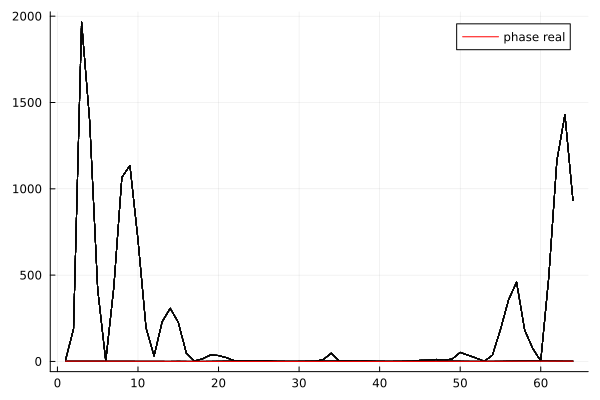

In [74]:
idx = 1600
idx_max = length(rwm.X[1,:])
L = 600
fig = plot()
for i in 0:L
    # phi_re = reshape(rwm.X[1:Ty*Tx,end-i], Ty, Tx).*rwm.X[end-1,end-i]
    phi_re = reshape(rwm.X[:,end-i], Ty, Tx)


    plot!(phi_re[1,:],color=:black, label="", alpha=0.1)
end
plot!(phase_real[1,1:Tx], color=:red, label="phase real")
# phi_re = reshape(avg_state[1:Ty*Tx], Ty, Tx).*avg_state[end-1]
# plot!(phi_re[1,1:Tx], color=:red, label="phase real")
display(fig)




# fig2 = plot()
# for i in 0:L
#     phi_im = reshape(rwm.X[1:Ty*Tx,end-i], Ty, Tx).*rwm.X[end,end-i]

#     plot!(phi_im[1,:],color=:black, label="", alpha=0.1)
# end
# plot!(phase_complex[1,1:Tx], color=:red, label="phase real")
# # phi_im = reshape(avg_state[1:Ty*Tx], Ty, Tx).*avg_state[end]
# # plot!(phi_im[1,1:Tx], color=:red, label="phase real")
# display(fig2)


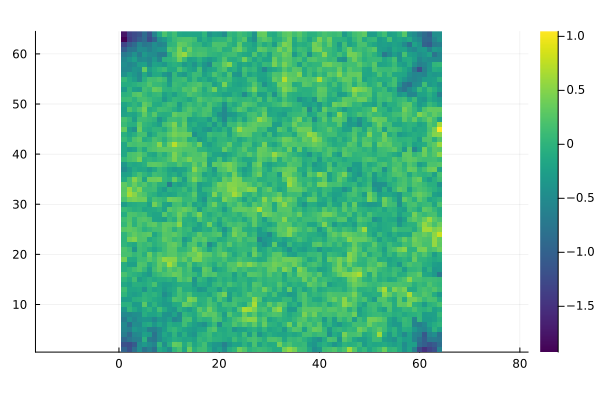

In [238]:
heatmap(phi_re.-phase_real[1:Ty,1:Tx], aspect_ratio=1, c=:viridis, colorbar=true, axis=true)

In [233]:
avg_state2 = mean(out2.X[:,end÷5:end], dims=2);
avg_state_std2 = std(out2.X[:,end÷2:end], dims=2);
println(ll_func(vec(avg_state2)))

-310.7297587931721


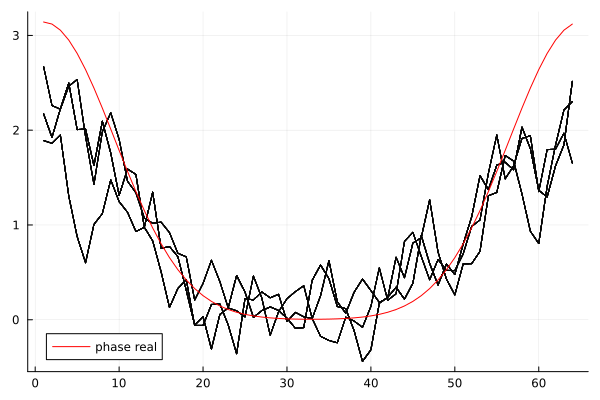

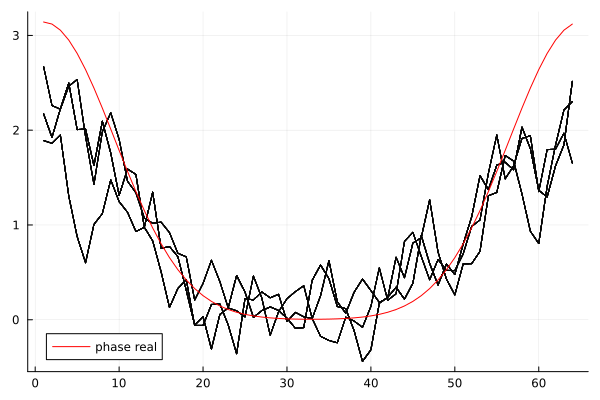

In [ ]:
idx = 1600
L = 600
fig = plot()
for i in 0:L
    phi_re = reshape(out2.X[1:Ty*Tx,end-i], Ty, Tx).*out2.X[end-1,end-i]

    plot!(phi_re[1,:],color=:black, label="", alpha=0.1)
end
plot!(phase_real[1,1:Tx], color=:red, label="phase real")
phi_re = reshape(avg_state[1:Ty*Tx], Ty, Tx).*avg_state[end-1]
plot!(phi_re[1,1:Tx], color=:red, label="phase real")
display(fig)
# phi_re = reshape(rwm.X[1:Ty*Tx,idx], Ty, Tx).*rwm.X[end-1,idx_max]
# phi_im = reshape(rwm.X[1:Ty*Tx,idx], Ty, Tx).*rwm.X[end,end]
# ψ_reconstructed = @. exp(1im*(phi_re + phi_im))
# scatter(rwm.X[:,idx], label="x")
# # heatmap(angle.(ψ_reconstructed), aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
# heatmap(phi_re, aspect_ratio=1, c=:viridis, colorbar=true, axis=true)
fig2 = plot()
for i in 0:L
    phi_im = reshape(rwm.X[1:Ty*Tx,end-i], Ty, Tx).*rwm.X[end,end-i]

    plot!(phi_im[1,:],color=:black, label="", alpha=0.1)
end
plot!(phase_complex[1,1:Tx], color=:red, label="phase real")
phi_im = reshape(avg_state[1:Ty*Tx], Ty, Tx).*avg_state[end]
plot!(phi_im[1,1:Tx], color=:red, label="phase real")
display(fig2)
# plot(x[1:Tx], phi_im[1,:], label="x")
# plot!(x[1:Tx], phase_complex[1,1:Tx], label="y", linestyle=:dash)
# scatter(sort(ideal_flat), sort(test_A(rwm.X[:,end])), label="x")

In [61]:
data_points =[]
for i in length(rwm.X[1,])
    for j in 1:length(rwm.X[1,])
        push!(data_points, (rwm.X[i,j], rwm.X[end-1,i], rwm.X[end,i]))
    end

[-0.07810738759439675, -0.07478903548487179, -0.06757343775737722, -0.0735125723068777, -0.0745524002885319, -0.07642231285432255, -0.09124942881393154, -0.09034255571731734, -0.08715029587979925, -0.09165631419483977, -0.09165631419483977]


In [72]:
summaries = describe(vec(rwm.X[1,end÷2:end]).*rwm.X[end-1,end])

Summary Stats:
Length:         8002
Missing Count:  0
Mean:           -0.923579
Std. Deviation: 0.255962
Minimum:        -1.633906
1st Quartile:   -1.107282
Median:         -0.898748
3rd Quartile:   -0.737052
Maximum:        -0.400167
Type:           Float64


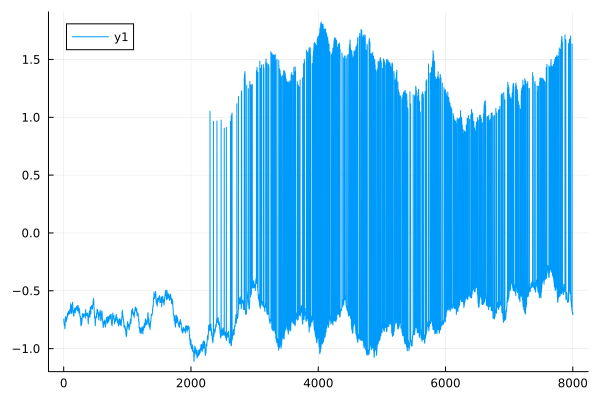

In [87]:
plot(rwm.X[1,end÷2:end].*rwm.X[end-1,end])

In [246]:
best_candidate = sol.minimizer

132098-element Vector{Float64}:
 1.2174759885902075e-5
 0.005422233684307303
 2.7193429872993695
 8.523311756355995e-6
 0.003843001055109881
 0.0018007400273281056
 0.00023079935141815077
 0.00068180018266788
 0.0003030194921024186
 0.0010093539640187027
 ⋮
 0.003459767935603105
 2.055958731921903
 1.922304842879474
 0.00016802639665652416
 7.033173844094319e-5
 0.001856023800932133
 0.0024203553095733794
 0.0051326147110683056
 0.0003091525193952343

In [227]:
fieldnames(typeof(sol))

(:u, :cache, :alg, :objective, :retcode, :original, :stats)

In [279]:
sol.stats

SciMLBase.OptimizationStats
Number of iterations:                              3755085
Time in seconds:                                   520.240329
Number of function evaluations:                    3755489
Number of gradient evaluations:                    0
Number of hessian evaluations:                     0

In [277]:
sol_previous = sol.u
# sol_square = reshape(sol.u, Ny, Nx, 2)
# sol_square = sol_square[1:Ty, 1:Tx, :]

8192-element Vector{Float64}:
 7.8097870198835135
 9.735007817069194
 9.759121928058427
 9.92382425401308
 0.9373629681978733
 0.07309988905802627
 0.0015136168468338647
 0.45872995062727795
 9.756355842520446
 6.991746471134604
 ⋮
 1.0000025713620102
 1.8104723132441551
 2.1804243483465786
 1.3362069357728432
 0.017696539996038516
 2.88956917275183e-5
 0.41718077103252127
 1.0786063197808495
 1.5048320699859594

In [380]:
using JuMP, Ipopt, ForwardDiff
using MAiNGO

Tx = 64
Ty = 64
Ny, Nx = size(ideal_measured)          # detector grid
λi, λr = 1e-2, 1e-2
# λi, λr, λb = 0, 0, 0

model=Model(Ipopt.Optimizer)
# @variable(model, φi[1:Nx,1:Ny], start = phase_real)
# @variable(model, φr[i=1:Nx, j=1:Ny], start = phase_real[i,j])
@variable(model, φr[i=1:Ty, j=1:Tx], start=phase_unwrapped[i,j])
@variable(model, φi[i=1:Ty, j=1:Tx], start=phase_unwrapped[i,j]/π*0.05, lower_bound=0.0, upper_bound=0.10)
# @variable(model, re_c)
# @variable(model, im_c)
# @variable(model, B[i=1:Ny, j=1:Nx], start=0.0)
# @variable(model, φr[1:Nx,1:Ny], start = phase_complex)
# @variable(model, φi[i=1:Nx, j=1:Ny], start = phase_complex[i,j],
#          lower_bound=-0.1, upper_bound=0.10)


# function phi_grid(φi::T, φr::T, Nx, Ny) where {T<:AbstractArray{VariableRef}}
    #     φi_grid = Matrix{NonlinearExpr}(undef, Ny, Nx)
    #     φr_grid = Matrix{NonlinearExpr}(undef, Ny, Nx)
    #     # φi_grid = zeros(Ny, Nx)
    #     # φr_grid = zeros(Ny, Nx)
        
    #     # φi_grid[1:Tx, 1:Ty] = φi
    #     # φr_grid[1:Tx, 1:Ty] = φr
    #     for i in 1:Ny
    #         i_peri = mod(i-1, Tx) + 1
    #         for j in 1:Nx
    #             j_peri = mod(j-1, Ty) + 1
    #             φi_grid[i, j] = φi[i_peri, j_peri]
    #             φr_grid[i, j] = φr[i_peri, j_peri]
    #         end
    #     end
    #     return φi_grid, φr_grid
    # end
@expression(model, φr_grid[i=1:Ny, j=1:Nx],
    φr[mod(i-1,Ty)+1, mod(j-1,Tx)+1])
@expression(model, φi_grid[i=1:Ny, j=1:Nx],
    φi[mod(i-1,Ty)+1, mod(j-1,Tx)+1])


# Usage:
# full_φi, full_φr = phi_grid(φi, φr, N, N)
# @variable(model,  b[1:Nx,1:Ny])
# @variable(model, θ_polar, lower_bound=0, upper_bound=π, start = 0)
# @variable(model, ϕ_azi, lower_bound=0, upper_bound=2π, start = deg2rad(45))
# @variable(model, λi_model, lower_bound=0)
# @variable(model, λr_model, lower_bound=0)

function reference_term(θ_polar,ϕ_azi)
    return @. 2π/Wavelength(E) * sin(θ_polar)*(cos(ϕ_azi)*x' + sin(ϕ_azi)*y)
end


# function ll_term(φi, φr)
#     ref_wave = @. reference_term(θ,ϕ)
#     model_for_I = @. exp(-2*φi) + 1 + 2*exp(-φi)*cos(φr - ref_wave) 
#     arg = @. ideal_measured*log(model_for_I + eps()) - model_for_I
#     return sum((arg))
# end

function ll_term(φi, φr)
    ref_wave = @. reference_term(θ,ϕ)
    Î = @. exp(-2*φi) + 1 + 2*exp(-φi)*cos(φr - ref_wave) 
    return -0.5* sum((Î .- ideal_measured).^2)
end

function smooth_penalty(φ)
    return sum(@. (φ[2:end,:] - φ[1:end-1,:])^2) +
           sum(@. (φ[:,2:end] - φ[:,1:end-1])^2)
end

function ll_term(φi, φr)
    ref_wave = @. 2π/Wavelength(E) * sin(θ)*(cos(ϕ)*x' + sin(ϕ)*y)
    Î = @. exp(-2*φi) + 1 + 2*exp(-φi)*cos(φr - ref_wave) 
    return -0.5* sum((Î .- ideal_measured).^2)
end

# llterm = @expression(model, ll_term(φi_grid, φr_grid)) 
# costϕi = @expression(model, smooth_penalty(φi_grid))
# costϕr = @expression(model, smooth_penalty(φr_grid))

# costb = @expression(model, smooth_penalty(b))
function Wavelength(E)
    hc = 12.398 #keV*Angstrom
    # h = 6.582119e-16 #eV*sec
    # mc2 = 511 #keV
    E₀ = 511 #keV
    return hc/sqrt(E*(2*E₀ + E))
end
hc = 12.398
E₀ = 511 #keV
WL = hc/sqrt(300*(2*E₀ + 300))
# @NLobjective(model, Max, llterm)

@NLobjective(model, Max,
    -0.5 * sum(
       ( exp(-2*φi_grid[i,j]) + 1 + 2*exp(-φi_grid[i,j])*cos(φr_grid[i,j] -
         (2π/WL*sin(θ)*(cos(ϕ)*x[j] + sin(ϕ)*y[i]))) - ideal_measured[i,j] )^2
       for i = 1:Ny, j = 1:Nx )
)
# set_optimizer_attribute(model, "hessian_approximation", "limited-memory")
# set_optimizer_attribute(model, "print_level", 5)
optimize!(model)


This is Ipopt version 3.14.17, running with linear solver MUMPS 5.7.3.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:    12288

Total number of variables............................:     8192
                     variables with only lower bounds:        0
                variables with lower and upper bounds:     4096
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.3432771e+04 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

In [381]:
println("Objective value: ", objective_value(model))
# println("θi: ", value(θ_polar))
# println("ϕ: ", value(ϕ_azi))

Objective value: -6535.483419600582


starting at \theta = 0 and \phi = 45

Objective value: -3824.890931924671

θi: 0.010091737353136943

ϕ: 6.215507323212204

setting \theta = \theta_{measured} and \phi = \phi_measured

Objective value: -9988.569070201866

θi: 0.180091 degrees

ϕ: 45 degrees

better than the one above, phase_re is still jagged but is 3\pi. phase_im is awful

setting a lower_bound = 0 for both phi_re and phi_im

Objective value: -21221.856466329973

worse

starting at \theta = 0 and \phi = 45

Objective value: -23861.22672099034

In [382]:
function phi_grid(φi, φr, Nx, Ny) 
    φi_grid = Matrix{Float64}(undef, Ny, Nx)
    φr_grid = Matrix{Float64}(undef, Ny, Nx)
    # φi_grid = zeros(Ny, Nx)
    # φr_grid = zeros(Ny, Nx)
    
    # φi_grid[1:Tx, 1:Ty] = φi
    # φr_grid[1:Tx, 1:Ty] = φr
    for i in 1:Ny
        i_peri = mod(i-1, Tx) + 1
        for j in 1:Nx
            j_peri = mod(j-1, Ty) + 1
            φi_grid[i, j] = φi[i_peri, j_peri]
            φr_grid[i, j] = φr[i_peri, j_peri]
        end
    end
    return φi_grid, φr_grid
end

phi_grid (generic function with 1 method)

In [17]:
using Plots
using Pkg
# Pkg.add("Turing")
# Pkg.add("MCMCChains")
# Pkg.add("AdvancedHMC")
using Random
using Turing
using MCMCChains
using AdvancedHMC
using StatsPlots

In [18]:
# Pkg.add("ReverseDiff")
# Pkg.add("Memoization")
using ReverseDiff, Memoization
Turing.setadbackend(:reversediff)

┌ Warning: `ADBACKEND` and `setbackend` are deprecated. Please specify the chunk size directly in the sampler constructor, e.g., `HMC(0.1, 5; adtype=AutoForwardDiff())`.
│  This function has no effects.
│   caller = ip:0x0
└ @ Core :-1


In [15]:
Threads.nthreads()

8

In [36]:
Random.seed!(123)  # For reproducibility
# @model function bayesian_linear_regression(x, y)
#     # Priors
#     a ~ Normal(0, 1)
#     b ~ Normal(0, 1)
#     σ ~ Exponential(1)

#     # Likelihood
#     for i in 1:length(x)
#         y[i] ~ Normal(a + b * x[i], σ)
#     end
# end

Ty, Tx = 64, 64
len_x = Ty*Tx
wave_reference = @. kmag * (sin(θ)*cos(ϕ)*x' + sin(θ)*sin(ϕ)*y)

# wave_reference = reshape(wave_reference, N,N,1)
wave_ref_flat = vec(wave_reference[1:Ty, 1:Tx])
ideal_flat = vec(ideal_measured[1:Ty, 1:Tx])
# measured_flat = vec(ideal_measured[1:Ty, 1:Tx])

μ = Vector{Float64}(undef, len_x)
param = 5
# @model function ll_MCMC(y, wave_ref_flat::T, μ::T) where {T<:AbstractVector{Float64}}
    

#     # 1) Prior on the flattened surface φ:
#     # φ ~ MvNormal(zeros(N), 1.0)           # or: filldist(Normal(0,1), N)

#     φ ~ filldist(truncated(Normal(1.0,0.5), 0, 2.5), len_x)
#     # 2) Priors on your scale parameters:
#     φr_scale ~ truncated(Normal(π/2, π/2), 0, 2π)
#     φi_scale ~ truncated(Normal(0.025, 0.025), 0, 0.15)
#     # 3) Noise scale:
#     σ ~ Exponential(1)
#     # 4) Likelihood
#     # Compute all the expected values at once
#     μ = @. exp(-2 * φi_scale * φ) + 1 + 2 * exp(-φi_scale * φ) * cos(φr_scale * φ + wave_ref_flat)
    
#     # Likelihood; assume independent Normal observations
#     y ~ arraydist(Normal.(μ, σ))
# end
@model function ll_MCMC(y, wave_ref_flat::T) where {T<:AbstractVector{Float64}}
    

    # 1) Prior on the flattened surface φ:
    # φ ~ MvNormal(zeros(N), 1.0)           # or: filldist(Normal(0,1), N)

    φ ~ filldist(truncated(Normal(1.0,2.0),0,2π), len_x)
    # 2) Priors on your scale parameters:
    φr_scale ~ truncated(Normal(1, π), 0, 2π)
    φi_scale ~ truncated(Normal(0.025, 0.5), 0, 1)
    # 3) Noise scale:
    σ ~ Exponential(1)
    # 4) Likelihood
    μ = @. exp(-2 * φi_scale * φ) + 1 + 2 * exp(-φi_scale * φ) * cos(φr_scale * φ - wave_ref_flat)

    # Likelihood; assume independent Normal observations
    for i in eachindex(y)
        y[i] ~ Normal(μ[i], σ)
    end
end
# Fit the model
model = ll_MCMC(ideal_flat, wave_ref_flat)
sampler = Turing.MH()
# chain = sample(model, sampler,MCMCThreads(), 10, 2)
chain = sample(model, sampler, 10000)

Sampling   0%|                                          |  ETA: N/A
Sampling   0%|▎                                         |  ETA: 0:04:48
Sampling   1%|▍                                         |  ETA: 0:02:32
Sampling   2%|▋                                         |  ETA: 0:01:47
Sampling   2%|▉                                         |  ETA: 0:01:24
Sampling   2%|█                                         |  ETA: 0:01:10
Sampling   3%|█▎                                        |  ETA: 0:01:01
Sampling   4%|█▌                                        |  ETA: 0:00:55
Sampling   4%|█▋                                        |  ETA: 0:00:56
Sampling   4%|█▉                                        |  ETA: 0:00:51
Sampling   5%|██▏                                       |  ETA: 0:00:48
Sampling   6%|██▎                                       |  ETA: 0:00:45
Sampling   6%|██▌                                       |  ETA: 0:00:42
Sampling   6%|██▊                                       |  ETA: 0:00

Chains MCMC chain (10000×4100×1 Array{Float64, 3}):

Iterations        = 1:1:10000
Number of chains  = 1
Samples per chain = 10000
Wall duration     = 13.42 seconds
Compute duration  = 13.42 seconds
parameters        = φ[1], φ[2], φ[3], φ[4], φ[5], φ[6], φ[7], φ[8], φ[9], φ[10], φ[11], φ[12], φ[13], φ[14], φ[15], φ[16], φ[17], φ[18], φ[19], φ[20], φ[21], φ[22], φ[23], φ[24], φ[25], φ[26], φ[27], φ[28], φ[29], φ[30], φ[31], φ[32], φ[33], φ[34], φ[35], φ[36], φ[37], φ[38], φ[39], φ[40], φ[41], φ[42], φ[43], φ[44], φ[45], φ[46], φ[47], φ[48], φ[49], φ[50], φ[51], φ[52], φ[53], φ[54], φ[55], φ[56], φ[57], φ[58], φ[59], φ[60], φ[61], φ[62], φ[63], φ[64], φ[65], φ[66], φ[67], φ[68], φ[69], φ[70], φ[71], φ[72], φ[73], φ[74], φ[75], φ[76], φ[77], φ[78], φ[79], φ[80], φ[81], φ[82], φ[83], φ[84], φ[85], φ[86], φ[87], φ[88], φ[89], φ[90], φ[91], φ[92], φ[93], φ[94], φ[95], φ[96], φ[97], φ[98], φ[99], φ[100], φ[101], φ[102], φ[103], φ[104], φ[105], φ[106], φ[107], φ[108], φ[109], φ[110], φ[111], φ

In [ ]:
size(chain)

(10000, 4100, 1)

In [1]:
plot(chain[end÷2:end, end-3:end, :], title="Posterior Distributions", xlabel="Parameter Value", ylabel="Density")

UndefVarError: UndefVarError: `chain` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [39]:
summaries, quantiles = describe(chain)

2-element Vector{ChainDataFrame}:
 Summary Statistics (4099 x 8)
 Quantiles (4099 x 6)

In [35]:
summaries

Summary Statistics
  parameters      mean       std      mcse   ess_bulk   ess_tail      rhat   e ⋯
      Symbol   Float64   Float64   Float64    Float64    Float64   Float64     ⋯

        φ[1]    1.1260    0.2936    0.1758     2.4937     6.3839    2.4968     ⋯
        φ[2]    1.4779    0.3994    0.2480     2.3113     2.1096    2.4887     ⋯
        φ[3]    3.8711    0.8996    0.5485     2.3347        NaN    2.4725     ⋯
        φ[4]    3.3337    2.0647    1.3935     2.2446        NaN    2.9673     ⋯
        φ[5]    2.1066    0.6953    0.2286     3.6986     2.2764    2.5520     ⋯
        φ[6]    3.9906    0.8104    0.3128     7.1083        NaN    2.4529     ⋯
        φ[7]    2.8579    0.4203    0.2050     2.7167     2.1608    2.4762     ⋯
        φ[8]    2.4573    0.8088    0.5243     2.7324     5.7812    2.4994     ⋯
        φ[9]    0.9108    0.5351    0.3302     2.3976     2.1096    2.5613     ⋯
       φ[10]    1.6350    0.8723    0.3902     6.5839     8.3836    2.7405     ⋯
       φ